In [1]:
from numpy.random import seed
seed(42)
from tensorflow.keras.utils import set_random_seed
set_random_seed(42)

2023-12-02 06:29:47.811725: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-02 06:29:47.834867: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-02 06:29:47.834894: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-02 06:29:47.834907: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-02 06:29:47.839066: I tensorflow/core/platform/cpu_feature_g

In [2]:
import random
import matplotlib.pyplot as plt
from keras.utils import load_img
from PIL import Image

In [3]:
#Se generantres números aleatorios para decidir qué imagenes se han usado para crear los Saliency Maps y Class Activation Maps.
#Al generarse los números aleatorios a partir de la misma semilla, serán los mismos en todas las notebooks.

aca_random = random.randint(1, 5000)
n_random = random.randint(1, 5000)
scc_random = random.randint(1, 5000)

In [4]:
aca_random, n_random, scc_random

(913, 205, 2254)

In [5]:
#Se generan los paths correspondientes a las imágenes seleccionadas aleatoriamente.

aca_path = '../lung_image_sets/lung_aca/lungaca' + str(aca_random) +'.jpeg'
n_path = '../lung_image_sets/lung_n/lungn' + str(n_random) +'.jpeg'
scc_path = '../lung_image_sets/lung_scc/lungscc' + str(scc_random) +'.jpeg'

In [6]:
#Se crea una lista con los paths en cuestión

selected_images = [aca_path, n_path, scc_path]

## Saliency Maps

In [7]:
# Se crean listas para iterar las imágenes guardadas

aca_paths = ['./SalMaps/aca_SimpleConv.jpg', './SalMaps/aca_Efficient.jpg', './SalMaps/aca_InceptionV3.jpg', './SalMaps/aca_ResNet50.jpg']
n_paths = ['./SalMaps/n_SimpleConv.jpg', './SalMaps/n_Efficient.jpg', './SalMaps/n_InceptionV3.jpg', './SalMaps/n_ResNet50.jpg']
scc_paths = ['./SalMaps/scc_SimpleConv.jpg', './SalMaps/scc_Efficient.jpg', './SalMaps/scc_InceptionV3.jpg', './SalMaps/scc_ResNet50.jpg']

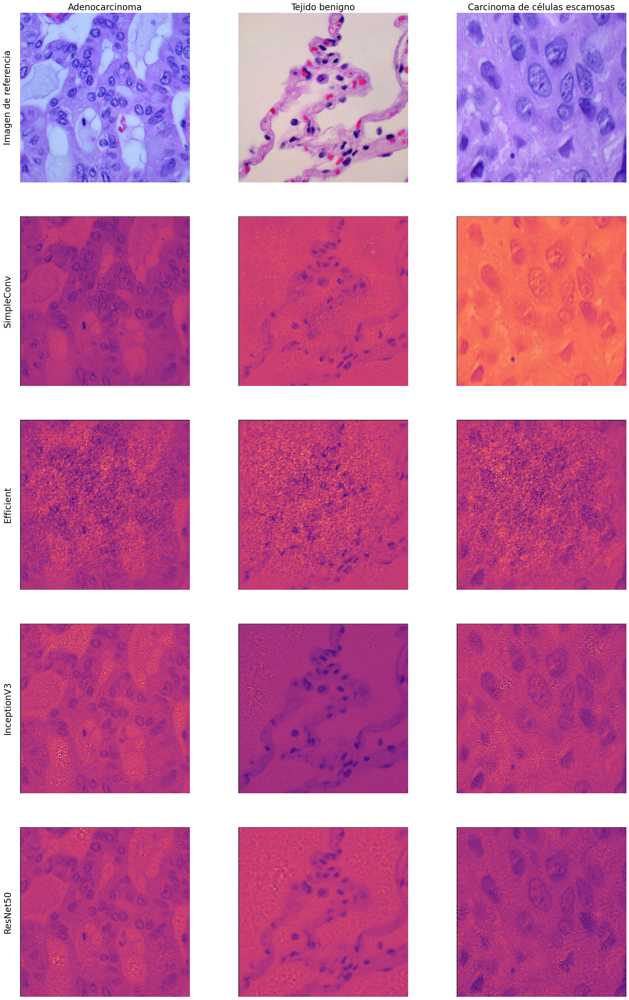

In [8]:
# Se genera la matriz de imágenes para los Saliency Maps
fig,axs = plt.subplots(5,3, figsize = (25, 40))
#Plotting original photos
axs[0,0].imshow(load_img(aca_path))
axs[0,0].set_axis_off()
axs[0,0].set_title("Adenocarcinoma", fontsize = 20)
axs[0,1].imshow(load_img(n_path))
axs[0,1].set_axis_off()
axs[0,1].set_title("Tejido benigno", fontsize = 20)
axs[0,1].title.set_text("Tejido benigno")
axs[0,2].imshow(load_img(scc_path))
axs[0,2].set_axis_off()
axs[0,2].set_title("Carcinoma de células escamosas", fontsize = 20)

axs[0,0].text(-0.1, 0.5, "Imagen de referencia", fontsize=20, va='center', rotation='vertical', transform=axs[0,0].transAxes)
axs[1,0].text(-0.1, 0.5, "SimpleConv", fontsize=20, va='center', rotation='vertical', transform=axs[1,0].transAxes)
axs[2,0].text(-0.1, 0.5, "Efficient", fontsize=20, va='center', rotation='vertical', transform=axs[2,0].transAxes)
axs[3,0].text(-0.1, 0.5, "InceptionV3", fontsize=20, va='center', rotation='vertical', transform=axs[3,0].transAxes)
axs[4,0].text(-0.1, 0.5, "ResNet50", fontsize=20, va='center', rotation='vertical', transform=axs[4,0].transAxes)

#Plotting Saliency Maps for the aca image
j = 1

for i in range(len(aca_paths)):
    img = Image.open(aca_paths[i])
    img = img.crop((0, 1562, 340, 1902))
    axs[j,0].imshow(img)
    axs[j,0].set_axis_off()
    j += 1

#Plotting Saliency Maps for the n image
j = 1

for i in range(len(n_paths)):
    img = Image.open(n_paths[i])
    img = img.crop((0, 1562, 340, 1902))
    axs[j,1].imshow(img)
    axs[j,1].set_axis_off()
    j += 1

#Plotting Saliency Maps for the scc image
j = 1

for i in range(len(scc_paths)):
    img = Image.open(scc_paths[i])
    img = img.crop((0, 1562, 340, 1902))
    axs[j,2].imshow(img)
    axs[j,2].set_axis_off()
    j += 1

plt.savefig('./Results/SaliencyMatrix.jpg')

## Class Activation Maps

In [9]:
# Se crean listas para iterar las imágenes guardadas

aca_paths = ['./CamMaps/aca_SimpleConv.jpg', './CamMaps/aca_Efficient.jpg', './CamMaps/aca_InceptionV3.jpg', './CamMaps/aca_ResNet50.jpg']
n_paths = ['./CamMaps/n_SimpleConv.jpg', './CamMaps/n_Efficient.jpg', './CamMaps/n_InceptionV3.jpg', './CamMaps/n_ResNet50.jpg']
scc_paths = ['./CamMaps/scc_SimpleConv.jpg', './CamMaps/scc_Efficient.jpg', './CamMaps/scc_InceptionV3.jpg', './CamMaps/scc_ResNet50.jpg']

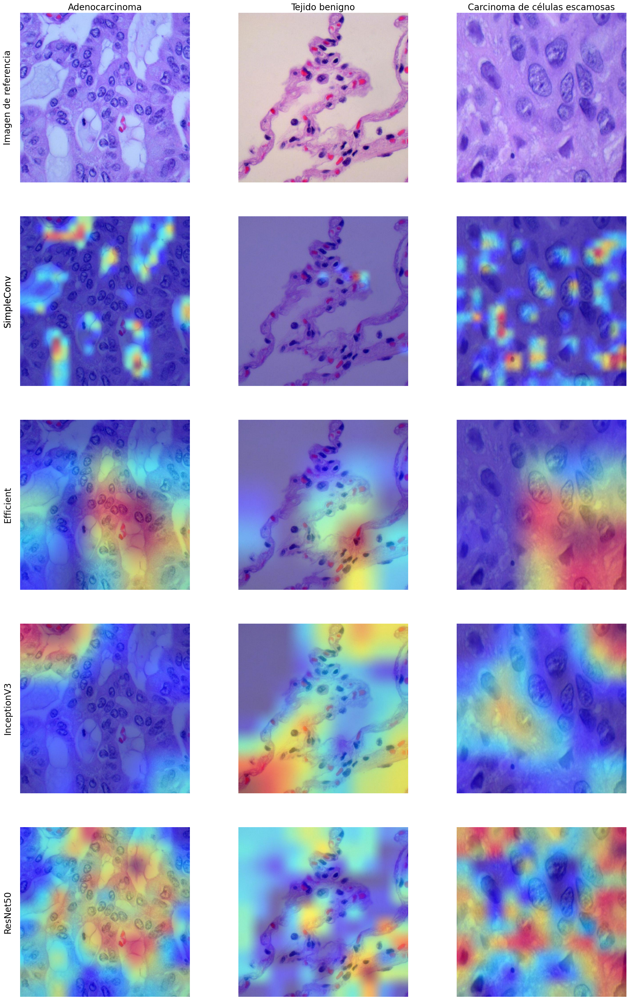

In [10]:
# Se genera la matriz de imágenes para los Class Activation Maps

fig,axs = plt.subplots(5,3, figsize = (25, 40))
#Plotting original photos

axs[0,0].imshow(load_img(aca_path))
axs[0,0].set_axis_off()
axs[0,0].set_title("Adenocarcinoma", fontsize = 20)
axs[1,0].text(-0.1, 0.5, "SimpleConv", fontsize=20, va='center', rotation='vertical', transform=axs[1,0].transAxes)
axs[0,1].imshow(load_img(n_path))
axs[0,1].set_axis_off()
axs[0,1].set_title("Tejido benigno", fontsize = 20)
axs[0,2].imshow(load_img(scc_path))
axs[0,2].set_axis_off()
axs[0,2].set_title("Carcinoma de células escamosas", fontsize = 20)

axs[0,0].text(-0.1, 0.5, "Imagen de referencia", fontsize=20, va='center', rotation='vertical', transform=axs[0,0].transAxes)
axs[1,0].text(-0.1, 0.5, "SimpleConv", fontsize=20, va='center', rotation='vertical', transform=axs[1,0].transAxes)
axs[2,0].text(-0.1, 0.5, "Efficient", fontsize=20, va='center', rotation='vertical', transform=axs[2,0].transAxes)
axs[3,0].text(-0.1, 0.5, "InceptionV3", fontsize=20, va='center', rotation='vertical', transform=axs[3,0].transAxes)
axs[4,0].text(-0.1, 0.5, "ResNet50", fontsize=20, va='center', rotation='vertical', transform=axs[4,0].transAxes)

#Plotting Class Activation Maps for the aca image
j = 1

for i in range(len(aca_paths)):
    img = Image.open(aca_paths[i])
    axs[j,0].imshow(img)
    axs[j,0].set_axis_off()
    j += 1

#Plotting Class Activation Maps for the n image
j = 1

for i in range(len(n_paths)):
    img = Image.open(n_paths[i])
    axs[j,1].imshow(img)
    axs[j,1].set_axis_off()
    j += 1

#Plotting Class Activation Maps for the scc image
j = 1

for i in range(len(scc_paths)):
    img = Image.open(scc_paths[i])
    axs[j,2].imshow(img)
    axs[j,2].set_axis_off()
    j += 1

plt.savefig('./Results/CAM_Matrix.jpg')